 # <center><b>Claude Monet Paintings and Generative Deep Learning</b></center>

# INTRODUCTION
The aim of this work is to build and train generative adversarial networks (GANs) using the Monet Paintings dataset available at Kaggle. GANs consists of two or more neural networks. There is a generator network that creates images and a discriminator network to train the generator. The discriminator classifies the images as real or fake. These are called adversarial networks because they are competing. The generator is working to maximize the chances that a mistake is made by the discriminator, and the discriminator is trying to minimize the chances of making a mistake. The task is to generate 7,000 to 10,000 images that are in the style of Monet’s paintings and fool the discriminator. 

**Citation:**

Amy Jang, Ana Sofia Uzsoy, Phil Culliton. (2020). I’m Something of a Painter Myself. Kaggle. https://kaggle.com/competitions/gan-getting-started

**GitHub Repository:**

https://github.com/grybkom/Generative-Deep-Learning-Monet-Paintings

# LIBRARIES

In [2]:
import os
import random
import shutil
import numpy as np
import itertools
import torch
from torch import nn
import torchvision.utils as vutils
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.nn import BCEWithLogitsLoss
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from PIL import Image
from typing import Tuple

# IMPORT DATA

In [3]:
# Input data files are available in the read-only "../input/" directory

for dirname, _, filenames in os.walk('/kaggle/input'):
    print(os.path.join(dirname))

/kaggle/input
/kaggle/input/gan-getting-started
/kaggle/input/gan-getting-started/monet_jpg
/kaggle/input/gan-getting-started/photo_tfrec
/kaggle/input/gan-getting-started/photo_jpg
/kaggle/input/gan-getting-started/monet_tfrec


## Dataset Directories

In [4]:
monet_dir = "/kaggle/input/gan-getting-started/monet_jpg/"
photo_dir = "/kaggle/input/gan-getting-started/photo_jpg/"

## Make a Subset of Photos
There are 7028 phots and 300 images of Monet paintings. To ensure the datasets are balanced and the models can be trained in a timely manner a random subset of 300 photos will be used. 

### Code to Clear Subset Directory
The subset directory needs to be cleared before selecting the subset or photos will continue to be added to it. 

In [7]:
# Check if the directory exists
if os.path.exists(photo_subset_dir):
    # Delete all files in the directory
    shutil.rmtree(photo_subset_dir)
    print(f"All photos in {photo_subset_dir} have been deleted.")
    os.makedirs(photo_subset_dir)
    print(f"{photo_subset_dir} directory has been recreated.")
else:
    print(f"Directory {photo_subset_dir} does not exist.")

All photos in /kaggle/working/photo_subset/ have been deleted.
/kaggle/working/photo_subset/ directory has been recreated.


### Create Subset

In [8]:
photo_subset_dir = "/kaggle/working/photo_subset/"

# Create a directory for the subset 
os.makedirs(photo_subset_dir, exist_ok=True)
all_photos = os.listdir(photo_dir)

# Randomly select 300 photos
subset_photos = random.sample(all_photos, 300)

# Copy selected photos to the subset directory
for photo in subset_photos:
    shutil.copy(os.path.join(photo_dir, photo), photo_subset_dir)

print("Subset of 300 photos created.")

Subset of 300 photos created.


# IMAGE PROCESSING

# Create PyTorch Class for Datasets
For loading and processing images from the directory to comply with PyTorch's data loading pipeline.

In [25]:
class CustomImageDataset(Dataset):
    def __init__(self, root: str, class_idx: int, max_size: int = -1, transform=None) -> None:
        """
        Initialize the dataset.
        
        root: image directory.
        class_idx: image labels.
        max_size: maximum number of images to load from the directory.
        transform: transformations to apply to the images.
        """
        self.paths = [os.path.join(root, img) for img in os.listdir(root)]
        random.shuffle(self.paths)
        self.paths = self.paths[:max_size] if max_size > 0 else self.paths
        self.transform = transform
        self.class_idx = class_idx

    def load_image(self, index: int) -> Image.Image:
        """
        Load an image from the dataset at the specified index.
        return: PIL Image
        """
        try:
            image = Image.open(self.paths[index])
            return image
        except Exception as e:
            print(f"Error loading image {self.paths[index]}: {e}")
            return None

    def __len__(self) -> int:
        """
        Return the total number of images in the dataset.
        """
        return len(self.paths) # Total number of samples
    
    def __getitem__(self, index: int) -> Tuple[torch.Tensor, int]:
        """
        Retrieve an image and its label.
        return: Tuple(transformed image tensor, class label).
        """
        img = self.load_image(index)
        if img is None:
            return None  # For error case 
        if self.transform:
            img = self.transform(img)
        return img, self.class_idx    


## Image Transformation
Images will be resized to 256 by 256. Then they will be randomly cropped to produce some variability. Pixel values will be normalized to have a mean of 0.5 and a standard deviation of 0.5 for each color channel.

In [26]:
# Data Transformations
data_transform = transforms.Compose([
    transforms.Resize(int(256 * 1.12), Image.BICUBIC),
    transforms.RandomCrop((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [27]:
# Create Datasets (use photo subset directory for photo dataset)
monet_dataset = CustomImageDataset(root=monet_dir, class_idx=1, transform=data_transform)
photo_dataset = CustomImageDataset(root=photo_subset_dir, class_idx=0, transform=data_transform)

# Data Loaders
batch_size = 8
num_workers = 2  

monet_dl = DataLoader(dataset=monet_dataset, batch_size=batch_size, num_workers=num_workers, pin_memory=True, shuffle=True)
photo_dl = DataLoader(dataset=photo_dataset, batch_size=batch_size, num_workers=num_workers, pin_memory=True, shuffle=True)

# DATA EXPLORATION

In [28]:
print(f"There are {len(monet_dataset)} images of Monet's Paintings")
print(f"There are {len(photo_dataset)} images of photos")

There are 300 images of Monet's Paintings
There are 300 images of photos


In [29]:
monets = next(iter(monet_dl))
photos = next(iter(photo_dl))

In [30]:
monets_imshow = []
for monet in monets:
    if monet.dim() == 4:  
        for img in monet:  # Loop through each image in the batch
            if img.dim() == 3:  # Ensure image is a 3D tensor 
                img = img.permute(1, 2, 0)  # Tensor [C, H, W] to [H, W, C]
                img = img.numpy()  # Tensor to NumPy array
                img = img * 0.5 + 0.5  # Undo data normalization
                monets_imshow.append(img)
            else:
                print(f"Skipping img with unexpected shape {img.shape}")
    else:
        print(f"Skipping tensor with shape {monet.shape}")
        
        
photos_imshow = []
for photo in photos:
    if photo.dim() == 4:  
        for img in photo:  # Loop through each image in the batch
            if img.dim() == 3:  # Ensure image is a 3D tensor 
                img = img.permute(1, 2, 0)  # Tensor [C, H, W] to [H, W, C]
                img = img.numpy()  # Tensor to NumPy array
                img = img * 0.5 + 0.5  # Undo data normalization
                photos_imshow.append(img)
            else:
                print(f"Skipping img with unexpected shape {img.shape}")
    else:
        print(f"Skipping tensor with shape {photo.shape}")       

Skipping tensor with shape torch.Size([8])
Skipping tensor with shape torch.Size([8])


## Display Examples of Monet Paintings and Photos

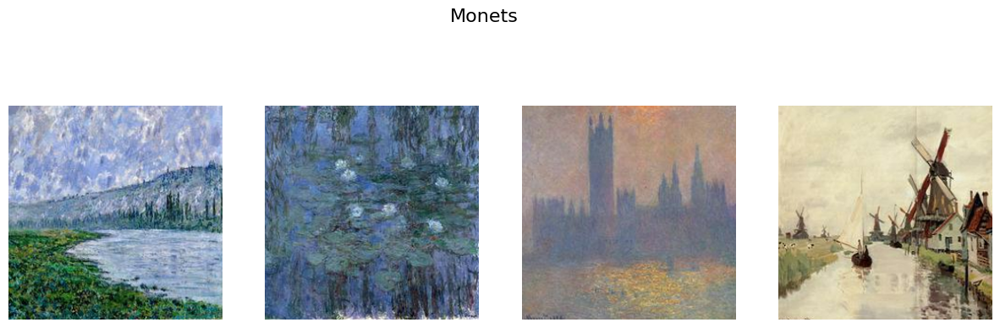

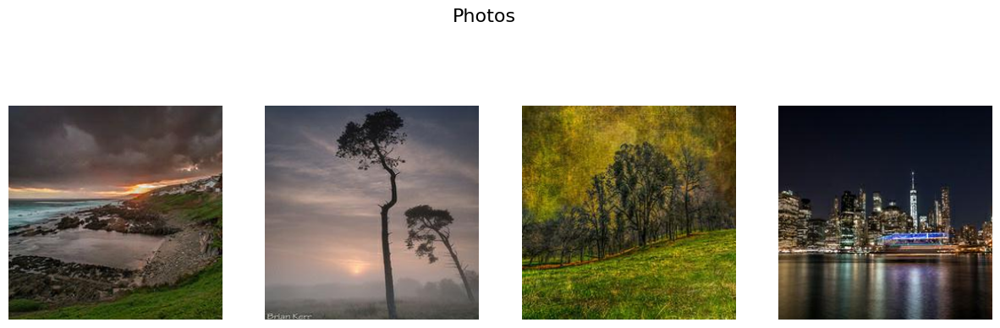

In [31]:
def display_images(images, title, n_images=4, figsize=(15, 5)):
    fig = plt.figure(figsize=figsize) 

    for i in range(n_images):
        plt.subplot(1, n_images, i+1)
        img = images[i]
        if torch.is_tensor(img):
            img = img.permute(1, 2, 0)  
            img = img.numpy()  
        plt.imshow(img)
        plt.axis('off')

    fig.suptitle(title, fontsize=16)
    plt.show()

display_images(monets_imshow, 'Monets')
display_images(photos_imshow, 'Photos')

# GAN MODELS

## Generator Function and Architecture

### Purpose of Generator
The generator analyzes the images, identifying the key attributes and modifying some of the attributes by adding noise to them. Its goal is to produce images that are indistinguishable from the real paintings. 

### Generator Architecture and Why it is Suitable
The network is made up of fully connected layers, including batch normalization layers to help stabilize the model, followed by Upsample layers to increase the spatial resolution, then Conv2d layers to extract image features. The Conv2d layers also add padding ensuring the output has the same dimensions as the input. LeakyReLU activations are used because they allow for negative inputs and are therefore more versatile and appropriate for distinguishing between images. Lastly a Tanh activation output layer scales the pixel values between -1 and 1. Since images are normalized to the range -1 and 1, the Tanh activation ensures that the pixel values of the generated images are within the expected range. See comments in code for details about specific layers. 




In [37]:
# Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.init_size = 64
        self.l1 = nn.Sequential(nn.Linear(100, 128 * self.init_size ** 2))
        
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128), # BatchNorm applied to 128 feature maps 
            nn.Upsample(scale_factor=2), # Doubles height and width of the input
            nn.Conv2d(128, 128, 3, stride=1, padding=1), # Input is 128 and output is 128
            nn.BatchNorm2d(128, 0.8), 
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2), 
            nn.Conv2d(128, 64, 3, stride=1, padding=1), # Input is 128 and output is 64
            nn.BatchNorm2d(64, 0.8), # BatchNorm applied to 64 feature maps
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 3, 3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

## Discriminator Function and Architecture

### Purpose of Discriminator
Takes the modified images from the generator as input and classifies it as real or fake. 

### Discriminator Architecture and Why it is Suitable
The core block of the discriminator uses a similar architecture as the generator. There is batch normalization, Conv2d Layers and, LeakyReLU activations are used for the same reasons as they were in the generator.  Dropout layers were also added to the discriminator to help prevent overfitting to specific patterns in the data, which improves stability. The discriminator uses sigmoid activation as the output to produce a probability as its purpose is to perform binary classification.  


In [51]:
# Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, bn=True):
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True), nn.Dropout2d(0.25)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block

        self.model = nn.Sequential(
            *discriminator_block(3, 16, bn=False),
            *discriminator_block(16, 32),
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )

        # Height and width of downsampled image
        ds_size = 256 // 2 ** 4
        self.adv_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, 1), nn.Sigmoid())

    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity

## Training the GAN
The networks are trained until the discriminator can no longer distinguish between the real and synthesized images. This will be done by adjusting the model’s weights with the discriminator loss function (loss_D) penalizing the discriminator for misclassifying images, and the generator loss function (loss_G) penalizing the generator if the discriminator can detect that the images are fake. The parameters of both networks are updated using an Adam optimizer. 

### Function to Show a Subset of Images as They are Being Generated

In [34]:
def show_generated_img(fake_images, epoch, batch):
    """
    Display images during training.
    
    fake_images: Tensor of generated images
    epoch: Current epoch number
    batch: Current batch number
    """
    # Undo normalization 
    fake_images = (fake_images * 0.5) + 0.5
    img_grid = vutils.make_grid(fake_images[:16], padding=2, normalize=True)
    
    # Plot
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(img_grid.cpu(), (1, 2, 0)))
    plt.title(f"Epoch {epoch}, Batch {batch}")
    plt.axis('off')
    plt.show()

## 1st Training
The first iteration of the training will use a learning rate of 0.002, beta1 set to 0.5 and beta2 set to 0.999. Beta1 sets the decay rate for the moving average of the gradient and beta2 controls the decay rate for the moving average of the squared gradient.

In [20]:
# Initialize models
generator = Generator()  
discriminator = Discriminator() 

# Binary cross-entropy loss function
criterion = nn.BCEWithLogitsLoss()

# Optimizers 
optimizer_g1 = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_d1 = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

### Monet's Paintings 1st Training

Epoch [0/20] Batch [0/38]                   Loss D: 0.7240215539932251, Loss G: 0.4746464788913727


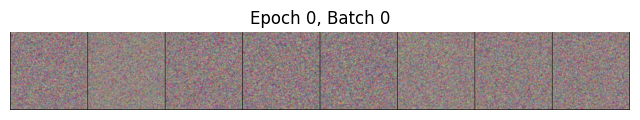

Epoch [1/20] Batch [0/38]                   Loss D: 0.6991023421287537, Loss G: 0.5409179925918579


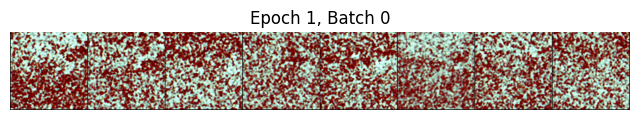

Epoch [2/20] Batch [0/38]                   Loss D: 0.6928436756134033, Loss G: 0.6420561075210571


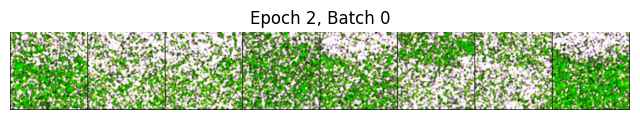

Epoch [3/20] Batch [0/38]                   Loss D: 0.6942646503448486, Loss G: 0.6691479086875916


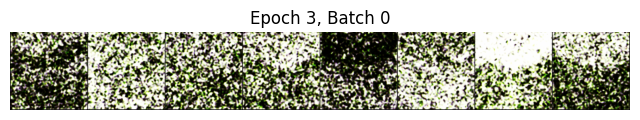

Epoch [4/20] Batch [0/38]                   Loss D: 0.6858481168746948, Loss G: 0.6554473042488098


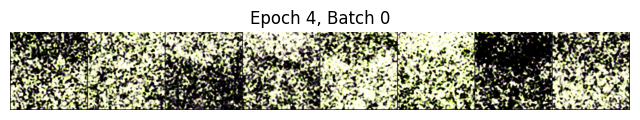

Epoch [5/20] Batch [0/38]                   Loss D: 0.7105824947357178, Loss G: 0.6352298855781555


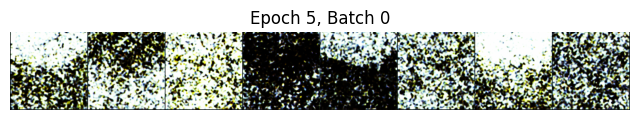

Epoch [6/20] Batch [0/38]                   Loss D: 0.6851478815078735, Loss G: 0.6873708367347717


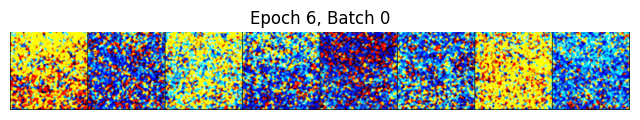

Epoch [7/20] Batch [0/38]                   Loss D: 0.6944113969802856, Loss G: 0.6840556263923645


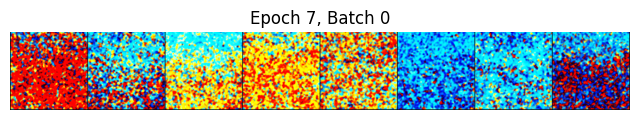

Epoch [8/20] Batch [0/38]                   Loss D: 0.6896758079528809, Loss G: 0.6773272156715393


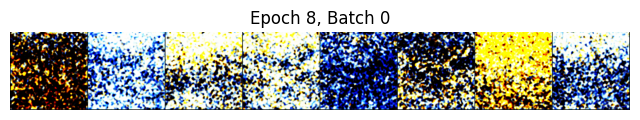

Epoch [9/20] Batch [0/38]                   Loss D: 0.6907816529273987, Loss G: 0.6849546432495117


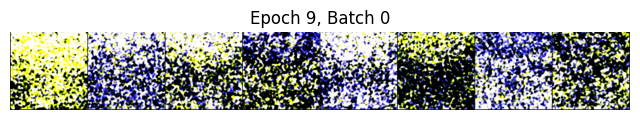

Epoch [10/20] Batch [0/38]                   Loss D: 0.6768021583557129, Loss G: 0.6248254776000977


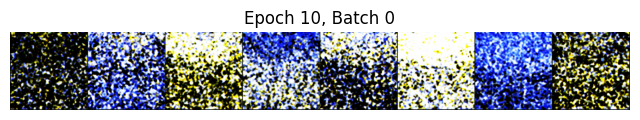

Epoch [11/20] Batch [0/38]                   Loss D: 0.6944390535354614, Loss G: 0.6492046117782593


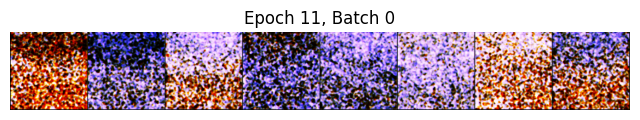

Epoch [12/20] Batch [0/38]                   Loss D: 0.681111216545105, Loss G: 0.6318075656890869


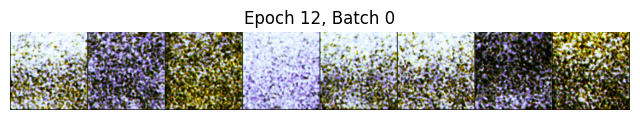

Epoch [13/20] Batch [0/38]                   Loss D: 0.6870929002761841, Loss G: 0.6677902340888977


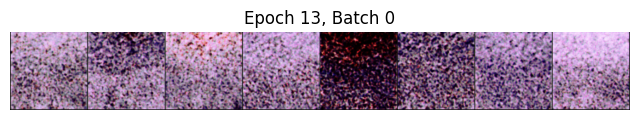

Epoch [14/20] Batch [0/38]                   Loss D: 0.7439713478088379, Loss G: 0.4930487871170044


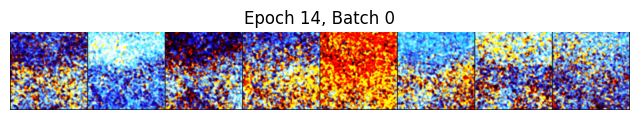

Epoch [15/20] Batch [0/38]                   Loss D: 0.6553783416748047, Loss G: 0.6418222188949585


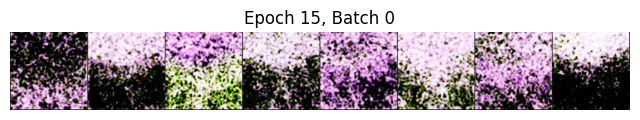

Epoch [16/20] Batch [0/38]                   Loss D: 0.8463426828384399, Loss G: 0.503322422504425


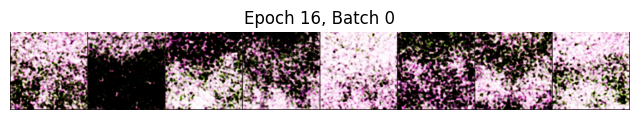

Epoch [17/20] Batch [0/38]                   Loss D: 0.680508017539978, Loss G: 0.6707783341407776


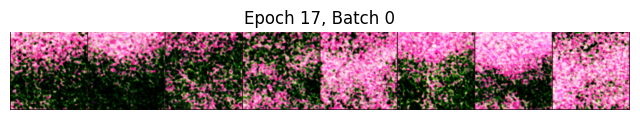

Epoch [18/20] Batch [0/38]                   Loss D: 0.6275888681411743, Loss G: 0.6389029026031494


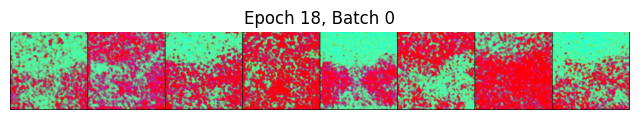

Epoch [19/20] Batch [0/38]                   Loss D: 0.7302953004837036, Loss G: 0.5197594165802002


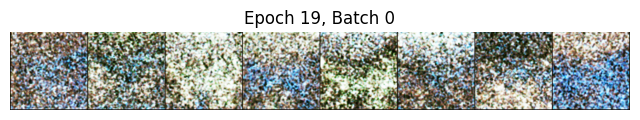

In [87]:
# Training loop Monet Paintings Take 1
num_epochs = 20
display_interval = 200  # For printing generated images

# Lists to hold training history
discriminator_losses_m1 = []
generator_losses_m1 = []

for epoch in range(num_epochs):
    for i, data in enumerate(monet_dl):
        # Unpack data 
        real_images, labels = data
        batch_size = real_images.size(0)

        # Generate fake images
        noise = torch.randn(batch_size, 100)
        fake_images_m1 = generator(noise)

        # Train discriminator
        discriminator.zero_grad()
        real_labels = torch.ones(batch_size, 1)
        fake_labels = torch.zeros(batch_size, 1)

        output_real = discriminator(real_images)
        loss_real = criterion(output_real, real_labels)

        output_fake = discriminator(fake_images_m1.detach())
        loss_fake = criterion(output_fake, fake_labels)

        loss_D = (loss_real + loss_fake) / 2  # Discriminator loss function
        loss_D.backward()
        optimizer_d1.step()
        discriminator_losses_m1.append(loss_D.item())  # Store the scalar value

        # Train generator
        generator.zero_grad()
        fake_labels = torch.ones(batch_size, 1)  # Trick discriminator
        output = discriminator(fake_images_m1)
        loss_G = criterion(output, fake_labels)  # Generator loss function
        loss_G.backward()
        optimizer_g1.step()
        generator_losses_m1.append(loss_G.item())  # Store the scalar value
        
        # Display generated images
        if i % display_interval == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{len(monet_dl)}] \
                  Loss D: {loss_D.item()}, Loss G: {loss_G.item()}")
            show_generated_img(fake_images_m1, epoch, i)

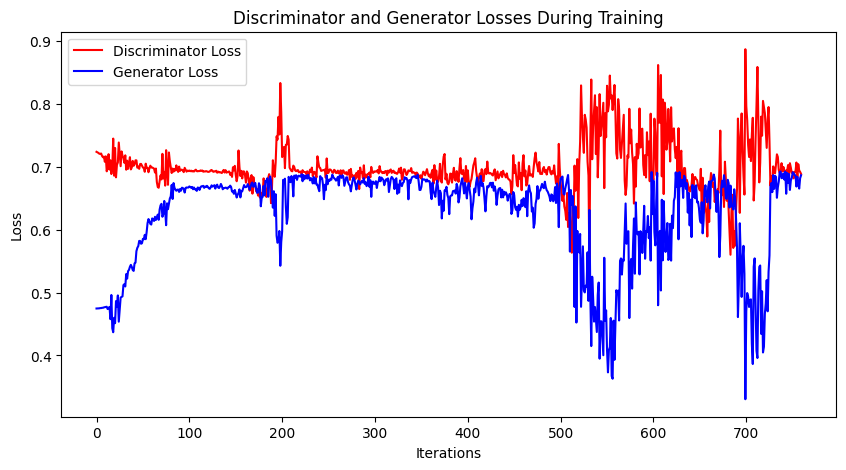

In [88]:
# Plotting Discriminator and Generator Losses
plt.figure(figsize=(10, 5))

# Plot Discriminator Loss
plt.plot(discriminator_losses_m1, label='Discriminator Loss', color='red')

# Plot Generator Loss
plt.plot(generator_losses_m1, label='Generator Loss', color='blue')
plt.title("Discriminator and Generator Losses During Training")
plt.xlabel("Iterations")
plt.ylabel("Loss")

## Results From 1st Training 
The discriminator loss measures how well the discriminator is distinguishing between real and generated samples. High discriminator loss means the discriminator is not differentiating between real and fake images very well. The generator loss measures how well the generator is fooling the discriminator. A low generator loss indicates the generator is successfully creating images that the discriminator cannot easily differentiate from real ones. There was no trend see in either of these metrics and they seemed unstable, indicating the network may not be learning very well. Also, based on visual inspection the generated images will not be fooling anyone. Therefore, more training attempts will be made. The learning rate will be lowered to help address the instability seen in the loss. Lower learning rates help stabilize the GAN and should help with convergence. 


## 2nd Training 
The learning rate will be slightly decreased from 0.0002 to 0.0001 and the number of epochs will be increased to 25. Other parameters will remain the same. 

In [54]:
# Initialize models
generator = Generator()  
discriminator = Discriminator() 

# Binary cross-entropy loss function
criterion = nn.BCEWithLogitsLoss()

# Optimizers 
optimizer_g2 = optim.Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.999))
optimizer_d2 = optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))

### Monet's Paintings 2nd Training

Epoch [0/25] Batch [0/38]                   Loss D: 0.7243248224258423, Loss G: 0.47428232431411743


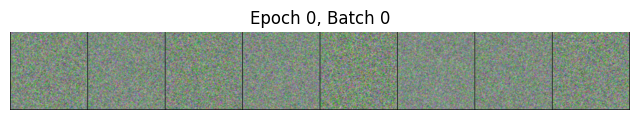

Epoch [1/25] Batch [0/38]                   Loss D: 0.7129626274108887, Loss G: 0.4498872756958008


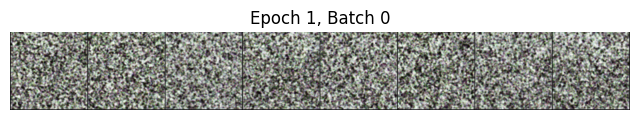

Epoch [2/25] Batch [0/38]                   Loss D: 0.6978080868721008, Loss G: 0.5528332591056824


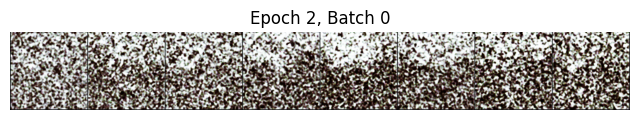

Epoch [3/25] Batch [0/38]                   Loss D: 0.7062612771987915, Loss G: 0.588185727596283


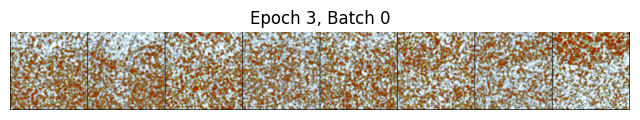

Epoch [4/25] Batch [0/38]                   Loss D: 0.665311336517334, Loss G: 0.6140565872192383


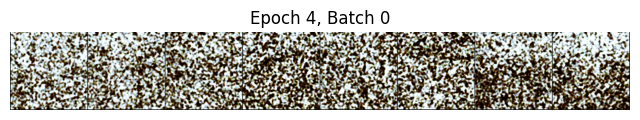

Epoch [5/25] Batch [0/38]                   Loss D: 0.6943956613540649, Loss G: 0.65324866771698


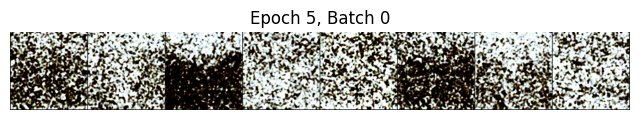

Epoch [6/25] Batch [0/38]                   Loss D: 0.692219614982605, Loss G: 0.6633868217468262


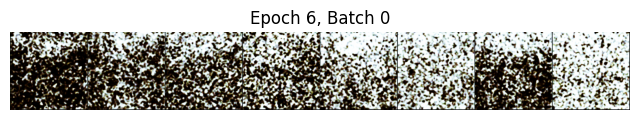

Epoch [7/25] Batch [0/38]                   Loss D: 0.6893629431724548, Loss G: 0.6678573489189148


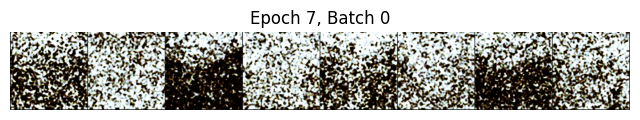

Epoch [8/25] Batch [0/38]                   Loss D: 0.6966572999954224, Loss G: 0.6610916256904602


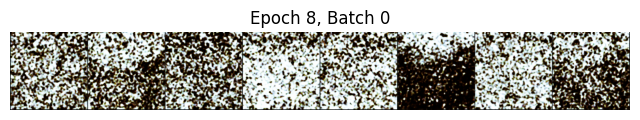

Epoch [9/25] Batch [0/38]                   Loss D: 0.6940090656280518, Loss G: 0.6555529236793518


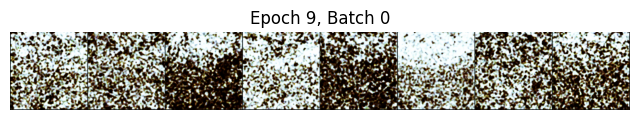

Epoch [10/25] Batch [0/38]                   Loss D: 0.6941282153129578, Loss G: 0.6453444957733154


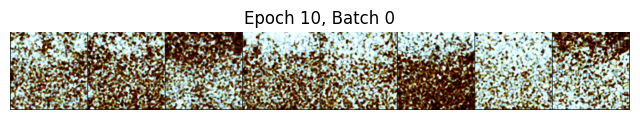

Epoch [11/25] Batch [0/38]                   Loss D: 0.6918792128562927, Loss G: 0.6586988568305969


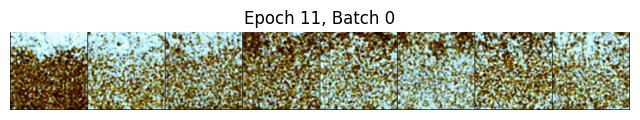

Epoch [12/25] Batch [0/38]                   Loss D: 0.6892470121383667, Loss G: 0.6650843024253845


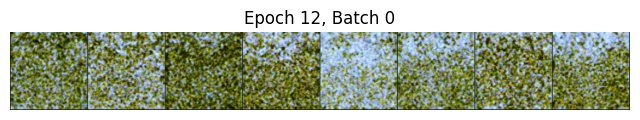

Epoch [13/25] Batch [0/38]                   Loss D: 0.6815197467803955, Loss G: 0.6722761988639832


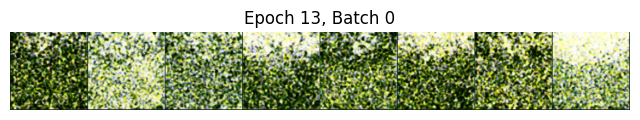

Epoch [14/25] Batch [0/38]                   Loss D: 0.6965827941894531, Loss G: 0.6598531007766724


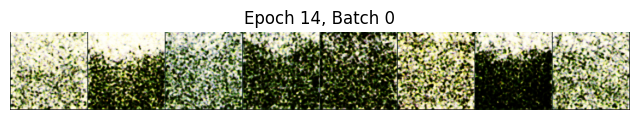

Epoch [15/25] Batch [0/38]                   Loss D: 0.7008658647537231, Loss G: 0.6505607962608337


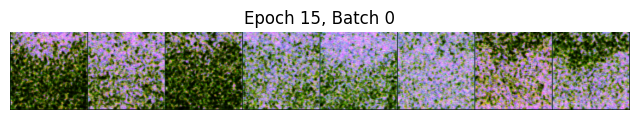

Epoch [16/25] Batch [0/38]                   Loss D: 0.6766722798347473, Loss G: 0.6584432721138


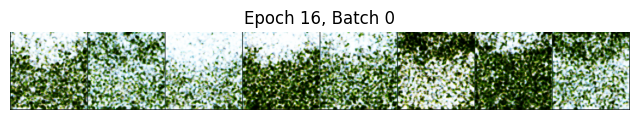

Epoch [17/25] Batch [0/38]                   Loss D: 0.6959310173988342, Loss G: 0.6410815119743347


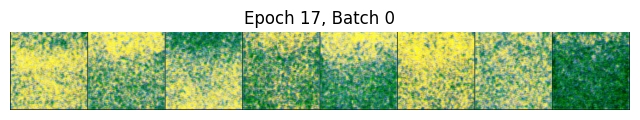

Epoch [18/25] Batch [0/38]                   Loss D: 0.6901772022247314, Loss G: 0.6711404919624329


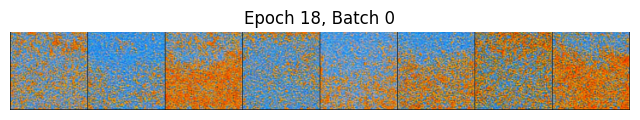

Epoch [19/25] Batch [0/38]                   Loss D: 0.6448974013328552, Loss G: 0.6481661796569824


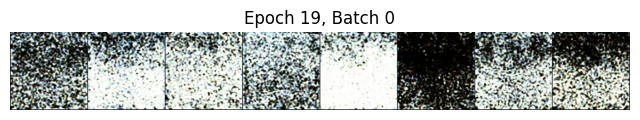

Epoch [20/25] Batch [0/38]                   Loss D: 0.6315895318984985, Loss G: 0.5767233371734619


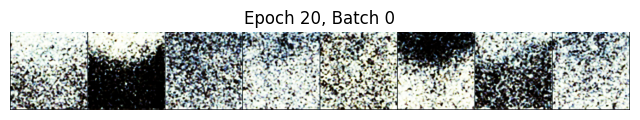

Epoch [21/25] Batch [0/38]                   Loss D: 0.7229495048522949, Loss G: 0.5810672044754028


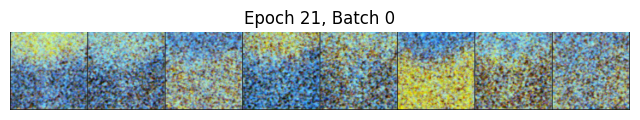

Epoch [22/25] Batch [0/38]                   Loss D: 0.6610968112945557, Loss G: 0.6370519995689392


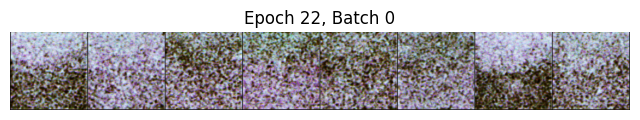

Epoch [23/25] Batch [0/38]                   Loss D: 0.6927808523178101, Loss G: 0.6485820412635803


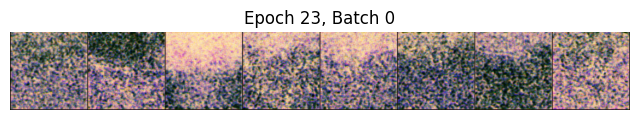

Epoch [24/25] Batch [0/38]                   Loss D: 0.6955061554908752, Loss G: 0.6738572120666504


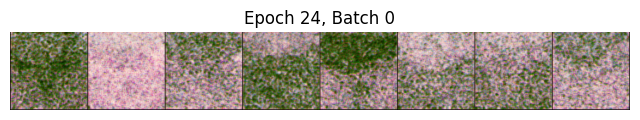

In [55]:
# Training loop Monet Paintings Take 2
num_epochs = 25
display_interval = 200  # For printing generated images

# Lists to hold training history
discriminator_losses_m2 = []
generator_losses_m2 = []

for epoch in range(num_epochs):
    for i, data in enumerate(monet_dl):
        # Unpack data 
        real_images, labels = data
        batch_size = real_images.size(0)

        # Generate fake images
        noise = torch.randn(batch_size, 100)
        fake_images_m2 = generator(noise)

        # Train discriminator
        discriminator.zero_grad()
        real_labels = torch.ones(batch_size, 1)
        fake_labels = torch.zeros(batch_size, 1)

        output_real = discriminator(real_images)
        loss_real = criterion(output_real, real_labels)

        output_fake = discriminator(fake_images_m2.detach())
        loss_fake = criterion(output_fake, fake_labels)

        loss_D = (loss_real + loss_fake) / 2  # Discriminator loss function
        loss_D.backward()
        optimizer_d2.step()
        discriminator_losses_m2.append(loss_D.item())  # Store the scalar value

        # Train generator
        generator.zero_grad()
        fake_labels = torch.ones(batch_size, 1)  # Trick discriminator
        output = discriminator(fake_images_m2)
        loss_G = criterion(output, fake_labels)  # Generator loss function
        loss_G.backward()
        optimizer_g2.step()
        generator_losses_m2.append(loss_G.item())  # Store the scalar value
        
        # Display generated images
        if i % display_interval == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{len(monet_dl)}] \
                  Loss D: {loss_D.item()}, Loss G: {loss_G.item()}")
            show_generated_img(fake_images_m2, epoch, i)

Text(0, 0.5, 'Loss')

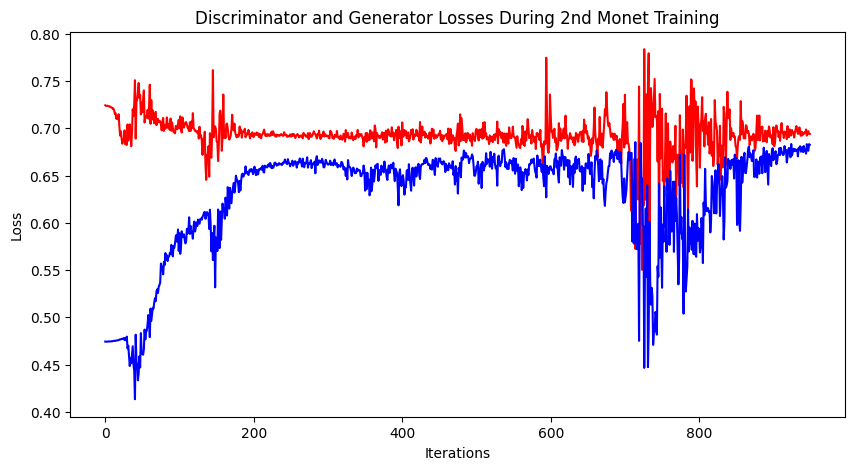

In [60]:
# Plotting Discriminator and Generator Losses
plt.figure(figsize=(10, 5))

# Plot Discriminator Loss
plt.plot(discriminator_losses_m2, label='Discriminator Loss', color='red')

# Plot Generator Loss
plt.plot(generator_losses_m2, label='Generator Loss', color='blue')
plt.title("Discriminator and Generator Losses During 2nd Monet Training")
plt.xlabel("Iterations")
plt.ylabel("Loss")

### Training on Photos 
The dataset of photographs is used as content input for the GAN. The network will apply the learned painting style of Monet to these photos. The training parameters used for the 2nd Monet training will be used for the photos. 

Epoch [0/25] Batch [0/38]                   Loss D: 0.6905936002731323, Loss G: 0.6809287667274475


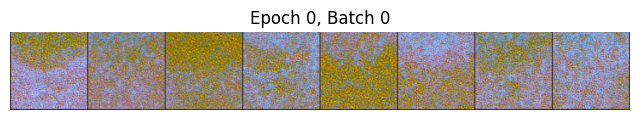

Epoch [1/25] Batch [0/38]                   Loss D: 0.6882691383361816, Loss G: 0.6843768954277039


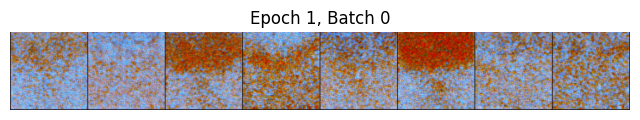

Epoch [2/25] Batch [0/38]                   Loss D: 0.6884592771530151, Loss G: 0.6841980218887329


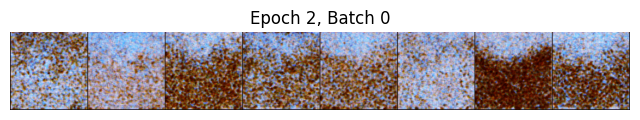

Epoch [3/25] Batch [0/38]                   Loss D: 0.7050514221191406, Loss G: 0.6755580902099609


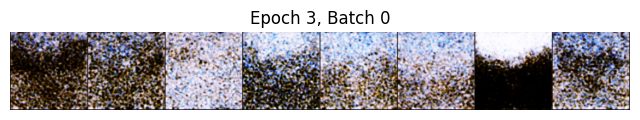

Epoch [4/25] Batch [0/38]                   Loss D: 0.6831787824630737, Loss G: 0.6877056360244751


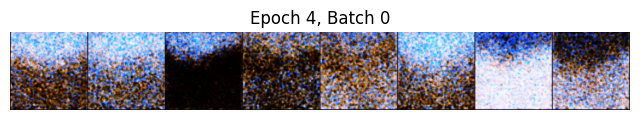

Epoch [5/25] Batch [0/38]                   Loss D: 0.678737998008728, Loss G: 0.6687403321266174


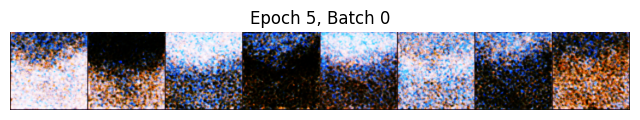

Epoch [6/25] Batch [0/38]                   Loss D: 0.6934394240379333, Loss G: 0.6777313947677612


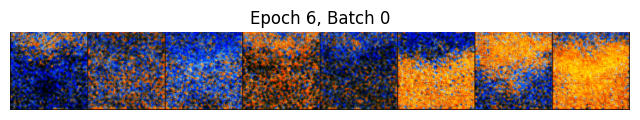

Epoch [7/25] Batch [0/38]                   Loss D: 0.6943783760070801, Loss G: 0.6881882548332214


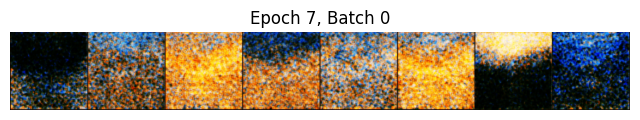

Epoch [8/25] Batch [0/38]                   Loss D: 0.6745961904525757, Loss G: 0.6741619110107422


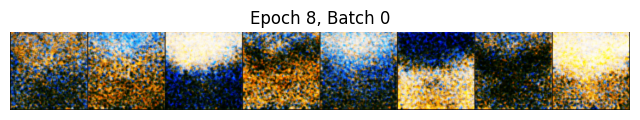

Epoch [9/25] Batch [0/38]                   Loss D: 0.6941419839859009, Loss G: 0.659045398235321


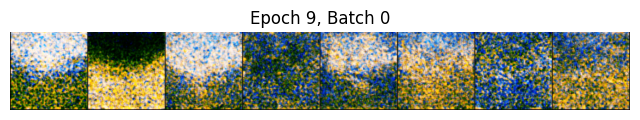

Epoch [10/25] Batch [0/38]                   Loss D: 0.6974340677261353, Loss G: 0.6901186108589172


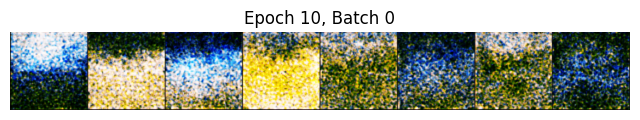

Epoch [11/25] Batch [0/38]                   Loss D: 0.6857452392578125, Loss G: 0.6650365591049194


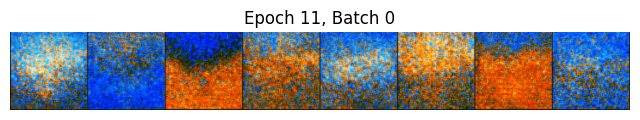

Epoch [12/25] Batch [0/38]                   Loss D: 0.6902235746383667, Loss G: 0.6683121919631958


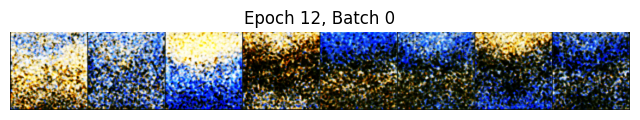

Epoch [13/25] Batch [0/38]                   Loss D: 0.6836289167404175, Loss G: 0.6720885038375854


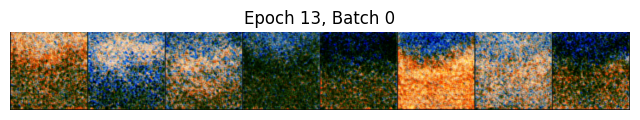

Epoch [14/25] Batch [0/38]                   Loss D: 0.6992102861404419, Loss G: 0.6853494644165039


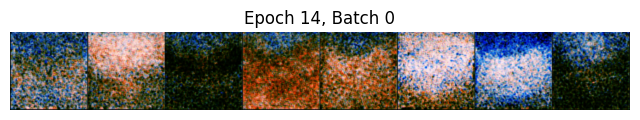

Epoch [15/25] Batch [0/38]                   Loss D: 0.6918905973434448, Loss G: 0.6878727078437805


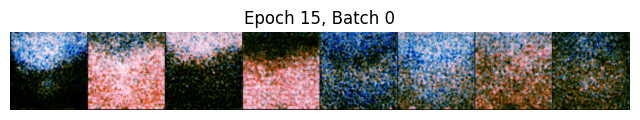

Epoch [16/25] Batch [0/38]                   Loss D: 0.6966465711593628, Loss G: 0.689824104309082


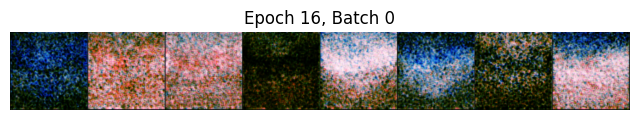

Epoch [17/25] Batch [0/38]                   Loss D: 0.6934735774993896, Loss G: 0.6896780729293823


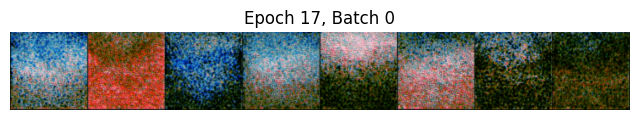

Epoch [18/25] Batch [0/38]                   Loss D: 0.6950163245201111, Loss G: 0.6884068846702576


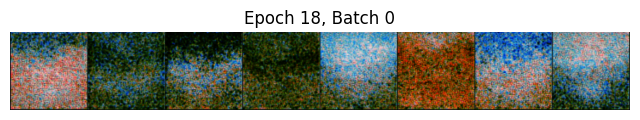

Epoch [19/25] Batch [0/38]                   Loss D: 0.6925392746925354, Loss G: 0.6688942909240723


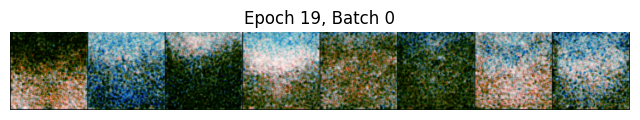

Epoch [20/25] Batch [0/38]                   Loss D: 0.6932996511459351, Loss G: 0.6792439222335815


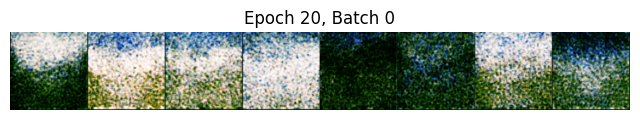

Epoch [21/25] Batch [0/38]                   Loss D: 0.7094645500183105, Loss G: 0.677459716796875


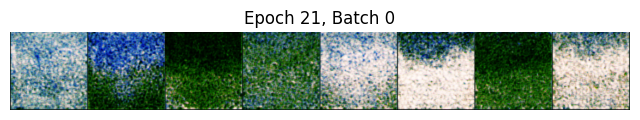

Epoch [22/25] Batch [0/38]                   Loss D: 0.6960302591323853, Loss G: 0.6796598434448242


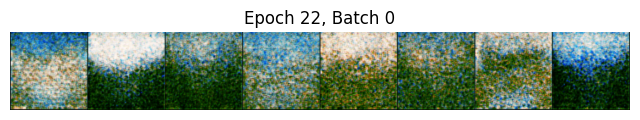

Epoch [23/25] Batch [0/38]                   Loss D: 0.6957066059112549, Loss G: 0.682998538017273


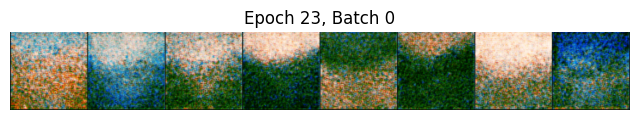

Epoch [24/25] Batch [0/38]                   Loss D: 0.6971807479858398, Loss G: 0.6833656430244446


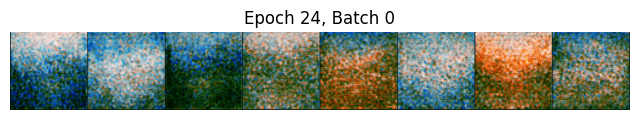

In [58]:
# Training loop Photos 
num_epochs = 25
display_interval = 200  # For printing generated images

# Lists to hold training history
discriminator_losses_p2 = []
generator_losses_p2 = []

for epoch in range(num_epochs):
    for i, data in enumerate(photo_dl): # change to photo dataset
        # Unpack data 
        real_images, labels = data
        batch_size = real_images.size(0)

        # Generate fake images
        noise = torch.randn(batch_size, 100)
        fake_images_p2 = generator(noise)

        # Train discriminator
        discriminator.zero_grad()
        real_labels = torch.ones(batch_size, 1)
        fake_labels = torch.zeros(batch_size, 1)

        output_real = discriminator(real_images)
        loss_real = criterion(output_real, real_labels)

        output_fake = discriminator(fake_images_p2.detach())
        loss_fake = criterion(output_fake, fake_labels)

        loss_D = (loss_real + loss_fake) / 2  # Discriminator loss function
        loss_D.backward()
        optimizer_d2.step()
        discriminator_losses_p2.append(loss_D.item())  # Store the scalar value

        # Train generator
        generator.zero_grad()
        fake_labels = torch.ones(batch_size, 1)  # Trick discriminator
        output = discriminator(fake_images_p2)
        loss_G = criterion(output, fake_labels)  # Generator loss function
        loss_G.backward()
        optimizer_g2.step()
        generator_losses_p2.append(loss_G.item())  # Store the scalar value
        
        # Display generated images
        if i % display_interval == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{len(photo_dl)}] \
                  Loss D: {loss_D.item()}, Loss G: {loss_G.item()}")
            show_generated_img(fake_images_p2, epoch, i)

Text(0, 0.5, 'Loss')

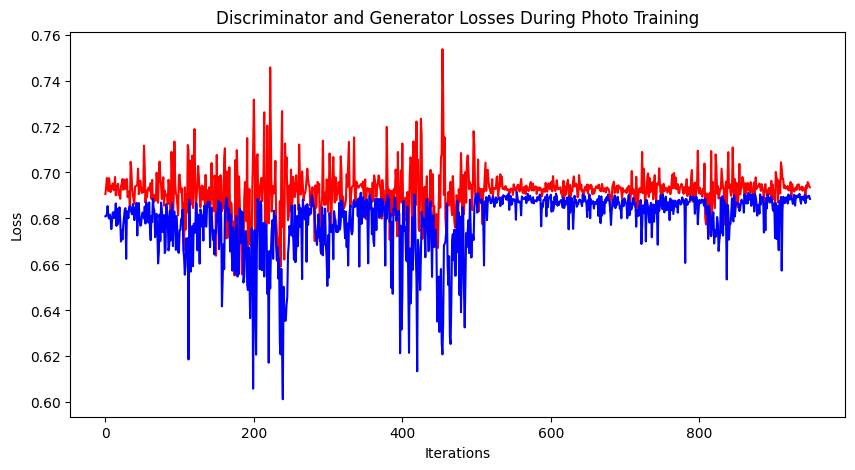

In [62]:
# Plotting Discriminator and Generator Losses
plt.figure(figsize=(10, 5))

# Plot Discriminator Loss
plt.plot(discriminator_losses_p2, label='Discriminator Loss', color='red')

# Plot Generator Loss
plt.plot(generator_losses_p2, label='Generator Loss', color='blue')
plt.title("Discriminator and Generator Losses During Photo Training")
plt.xlabel("Iterations")
plt.ylabel("Loss")

## Results 2nd Training
The model did not tolerate large changes in the learning rate. This model used a slightly lower learning rate than the first model, adjusted from 0.0002 to 0.0001. The number of epochs was also increased from 20 to 25. Lower learning rates were attempted but the training was terminated because the quality of the images was poor, and the images looked very similar from epoch to epoch (data not shown because of termination). Lack of diversity in the images generated is a sign that the model is collapsing (Van Otten, 2023). Model performance was evaluated with increased discriminator dropout rates, but this also caused the model to collapse (data not shown because of termination).


# COMPETITION SUBMISSION

In [ ]:
import zipfile
import shutil

# Directory
output_dir = "/kaggle/working/generated_images/"
os.makedirs(output_dir, exist_ok=True)

num_images = 7250  # Generate 7,000-10,000 Monet-style images
batch_size = 16  # based on hardware capacity
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Ensure images are in the correct format
to_pil = transforms.ToPILImage()

## Generate Images

In [ ]:
# Generate images
generator.eval()
for i in range(0, num_images, batch_size):
    noise = torch.randn(batch_size, 100, device=device)
    with torch.no_grad():
        fake_images_sub = generator(noise)
    
    # Process each image 
    for j in range(fake_images_sub.size(0)):
        img = fake_images_sub[j]
        img = (img * 0.5) + 0.5  # Undo normalization
        img = to_pil(img.cpu())
        img.save(os.path.join(output_dir, f"monet_{i + j + 1}.jpg"))

print(f"Generated {num_images} images and saved them to {output_dir}")

In [ ]:
# Define path for the zip file
zip_path = "/kaggle/working/images.zip"

# Create a zip file
shutil.make_archive("/kaggle/working/images", 'zip', output_dir)

# Rename the zip file for cometion requirements "ONE output file named images.zip"
os.rename("/kaggle/working/images.zip", zip_path)
print(f"Images have been zipped and saved to {zip_path}")

# CONCLUSION

## Reiteration of Results
The images created were not very good representations of the images provided and the model did not capture fine details. However, the level complexity in the generated images did appear to increase during training. I found that large adjustments to the learning rate, dropout and beta parameters to be problematic. The initial dropout rate in the discriminator was 25% and, based on visual inspection, the network would completely fail if it was increased over 35%. Also, the network did not tolerate large changes in the learning rate. The initial learning rate was 0.0002 and rates above 0.0005 caused the training to stall, probably due to the model collapsing. The model did tolerate small decreases in the learning rate. 

## Learning and Takeaways
GANs are notoriously tricky to train (Del Pra, 2023). This is because two networks need to be optimized and work in conjunction to produce realistic data. The run time was one of the major challenges. Having to wait hours to assess the model’s performance makes tuning hyperparameters difficult. Including code to occasionally display some of the generated images is very helpful in assessing the model’s performance. If the model is not working well the training can be stopped and parameters tuned. Also, it is helpful not to tune too many parameters at once. These networks are very finnicky and it can be difficult to understand what is happening to the model if multiple parameters are adjusted simultaneously. I was surprised at the dramatic effect small changes in the hyperparameters had.

## Why Something Didn’t Work
For this exercise it was helpful to use a randomly selected subset of the provided photos. I initially tried to train the networks on the full set of over 7,000 photos and it was incredibly slow. Kaggle shutdown my session as I was trying to train the full set of photos. Using fewer photos also ensured the datasets were balanced. 

## Suggestions for Ways to Improve
There are many steps that can be taken to improve the GAN’s performance. One strategy would be to build a cyclicGAN. Darmawankevinsanadi (2024) had success with this task by building and applying a cyclicGAN. These networks are like traditional GANs, the main difference is that they use two generators and two discriminators instead of one of each. This will cause the training time to increase and parameter tuning more difficult as the complexity increases. Spectral Normalization is another strategy that could be used to improve the model by stabilizing the discriminator's weights (Pandey, 2024). Just spending more time trying different architectures, run more epochs, and adjusting the hyperparameters would produce a better model. The main obstacle here is time since these networks are complex and take very long to train.

**References:**

Van Otten, N. (2023, December 1). Mode Collapse In GANs Explained, How To Detect It & Practical Solutions. Spot Intelligence. https://spotintelligence.com/2023/10/11/mode-collapse-in-gans-explained-how-to-detect-it-practical-solutions/

Del Pra, M. (2023, November 2). Generative Adversarial Networks - Marco del Pra - medium. Medium. https://medium.com/@marcodelpra/generative-adversarial-networks-dba10e1b4424

Darmawankevinsanadi. (2024, March 3). Monet style transfer with GAN on PyTorch - Darmawankevinsanadi - Medium. Medium. https://medium.com/@darmawankevinsanadi/monet-style-transfer-with-gan-on-pytorch-61156bb27e9c

Pandey, A. K. (2024, June 7). Spectral Normalization - Abhishek Kumar Pandey - Medium. Medium. https://medium.com/@akp83540/spectral-normalization-a76e5ef884ba

**Data**

Amy Jang, Ana Sofia Uzsoy, Phil Culliton. (2020). I’m Something of a Painter Myself. Kaggle. https://kaggle.com/competitions/gan-getting-started